<b> Task 1 </b>\
Task description:\
Using 3 images: GRAY.JPG (gray scale image with high resolution), RGB_half.JPG (rotated RGB image with lower resolution), RGB_quater.JPG(rotated RGB image with the lower resolution than other RGB) reconstruct RGB image of same resolution which has GRAY.JPG

What you need to do:
1. Reconstruct RGB from 3 images (2 results – from pair GRAY.JPG and RG_half.JPG and – from pair GRAY.JPG and RGB_quater.JPG)
2. Compare quality of reconstruction visually\
Comment:\
You could use any algorithms for pan sharpening and for aligning images coordinate systems.\
But for the start point you could see on materials (openCV samples and some links about image color spaces)

<b> Task 2 </b>

Calibrate your smartphone camera\
Reproduce pose estimation tutorial with calibrated camera (https://docs.opencv.org/4.5.0/d7/d53/tutorial_py_pose.html)

# Task 1

## Load data

Load data from gdrive, read and visualize

In [1]:
from google_drive_downloader import GoogleDriveDownloader as gdd
import zipfile
import cv2
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (14,14)

In [2]:
# donwload from gdrive
gdd.download_file_from_google_drive(file_id='1VJeXA2zesNr0ACmFoSAqi_Us8-SWA5tg',
                                    dest_path='./data/hw1.zip')

In [3]:
# unzip
with zipfile.ZipFile("./data/hw1.zip", 'r') as zip_ref:
    zip_ref.extractall("./data/")

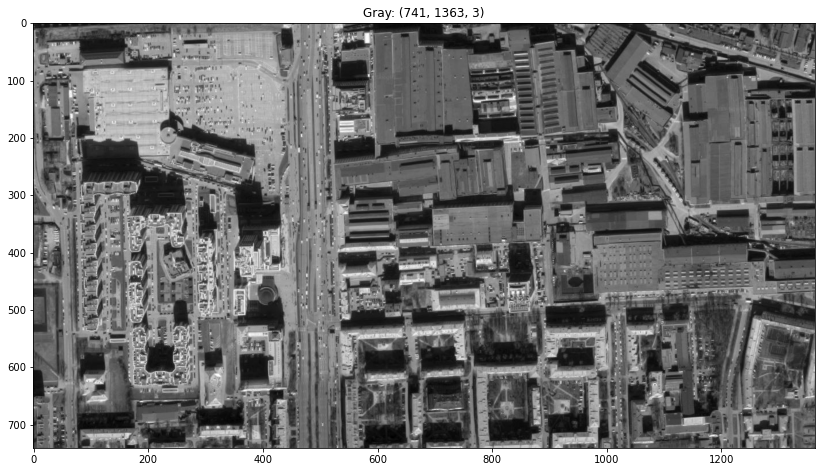

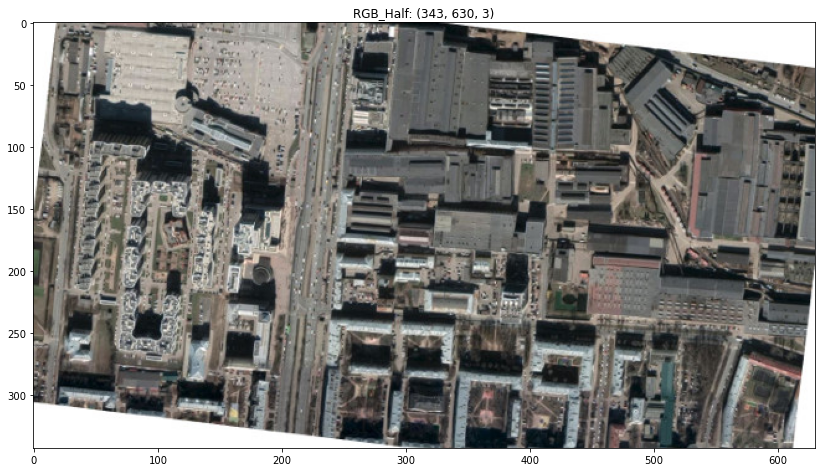

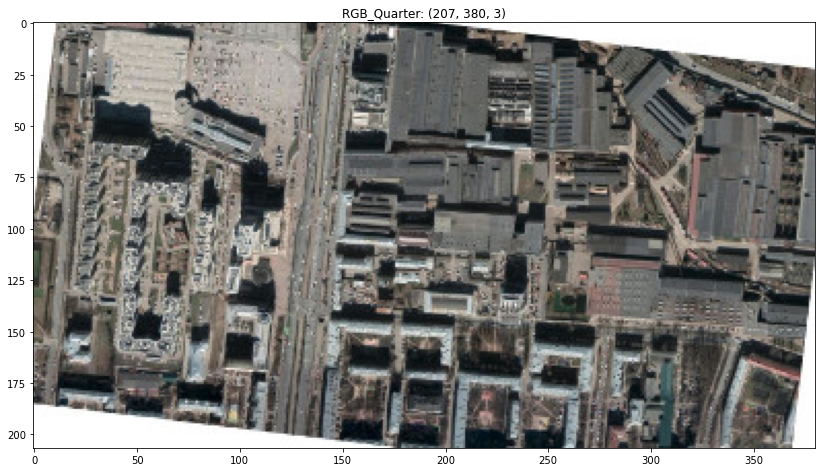

In [4]:
# read data
gray = cv2.imread('./data/GRAY.JPG')
rgb_half = cv2.imread('./data/RGB_half.JPG')
rgb_quater = cv2.imread('./data/RGB_quater.JPG')
rgb_half = cv2.cvtColor(rgb_half, cv2.COLOR_BGR2RGB)
rgb_quater = cv2.cvtColor(rgb_quater, cv2.COLOR_BGR2RGB)

plt.imshow(gray, cmap='gray')
plt.title(f"Gray: {gray.shape}")
plt.show()
plt.imshow(rgb_half)
plt.title(f"RGB_Half: {rgb_half.shape}")
plt.show()
plt.imshow(rgb_quater)
plt.title(f"RGB_Quarter: {rgb_quater.shape}")
plt.show()

## Alignment

Align and reshape images with opencv

In [5]:
import numpy as np

In [6]:
def align_image(image, template):
    '''
    Align image to template
    '''
    # Conver to grayscale
    image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    template_gray = cv2.cvtColor(template, cv2.COLOR_BGR2GRAY)
    # Detect features
    keypoints1, descriptors1 = cv2.ORB_create(1500).detectAndCompute(image_gray, None)
    keypoints2, descriptors2 = cv2.ORB_create(1500).detectAndCompute(template_gray, None)
    # Match features
    matcher = cv2.DescriptorMatcher_create(cv2.DESCRIPTOR_MATCHER_BRUTEFORCE_HAMMING)
    matches = matcher.match(descriptors1, descriptors2, None)
    # Sort by distance
    matches.sort(key=lambda x: x.distance, reverse=False)
    # Remove not so good matches
    numGoodMatches = int(len(matches) * 0.2)
    matches = matches[:numGoodMatches]
    # Save top matches
    imMatches = cv2.drawMatches(image, keypoints1, template, keypoints2, matches, None)
    # Extract location of good matches
    points1 = np.zeros((len(matches), 2), dtype=np.float32)
    points2 = np.zeros((len(matches), 2), dtype=np.float32)
    for i, match in enumerate(matches):
        points1[i] = keypoints1[match.queryIdx].pt
        points2[i] = keypoints2[match.trainIdx].pt
    # Find homography
    H, mask = cv2.findHomography(points1, points2, cv2.RANSAC)
    # Use homography
    h, w = template.shape[:2]
    aligned = cv2.warpPerspective(image, H, (w, h))

    return imMatches, aligned

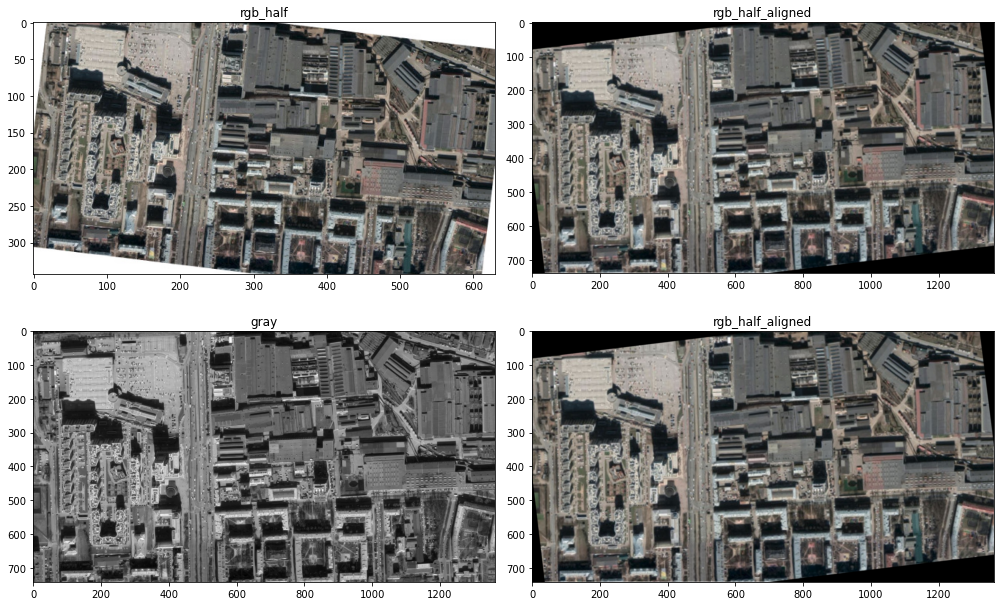

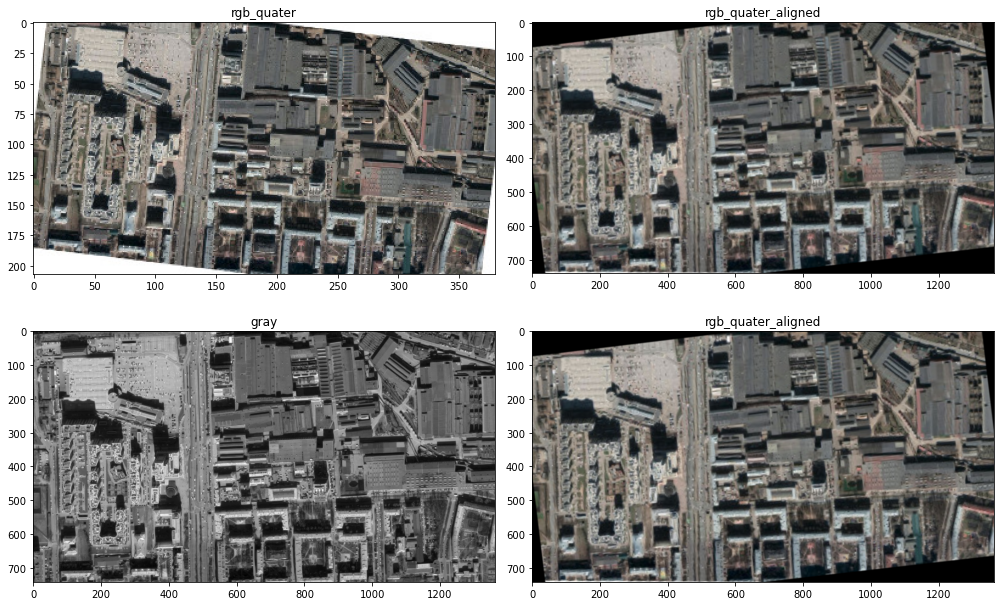

In [7]:
# align images
matches1, rgb_half_aligned = align_image(rgb_half, gray)
matches2, rgb_quater_aligned = align_image(rgb_quater, gray)
# rgb_half
fig, ax = plt.subplots(2, 2)
ax[0][0].imshow(rgb_half)
ax[0][0].set_title("rgb_half")
ax[0][1].imshow(rgb_half_aligned)
ax[0][1].set_title("rgb_half_aligned")
ax[1][0].imshow(gray)
ax[1][0].set_title("gray")
ax[1][1].imshow(rgb_half_aligned)
ax[1][1].set_title("rgb_half_aligned")
fig.tight_layout(h_pad=-25)
# rgb_quater
fig, ax = plt.subplots(2, 2)
ax[0][0].imshow(rgb_quater)
ax[0][0].set_title("rgb_quater")
ax[0][1].imshow(rgb_quater_aligned)
ax[0][1].set_title("rgb_quater_aligned")
ax[1][0].imshow(gray)
ax[1][0].set_title("gray")
ax[1][1].imshow(rgb_quater_aligned)
ax[1][1].set_title("rgb_quater_aligned")
fig.tight_layout(h_pad=-25)

## PanSharpening

For pan-sharpening I used two algorithms: brovey and average

In [8]:
def pan_sharpening(img, gray, algorithm="Average"):
    # change dtype
    img = img.astype(int)
    gray = gray.astype(int)
    # apply algorithm
    if algorithm == "Average":
        return np.stack([0.5*(img[..., 0] + gray[..., 0]),
                         0.5*(img[..., 1] + gray[..., 1]),
                         0.5*(img[..., 2] + gray[..., 2]),], axis=2).astype(int)
    elif algorithm == "Brovey":
        res = np.stack([img[..., 0] * (gray[..., 0] / (img.sum(2) + 1e-8)),
                img[..., 1] * (gray[..., 0] / (img.sum(2) + 1e-8)),
                img[..., 2] * (gray[..., 0] / (img.sum(2) + 1e-8))], axis=2)
        return (res - res.min()) / (res.max() - res.min())

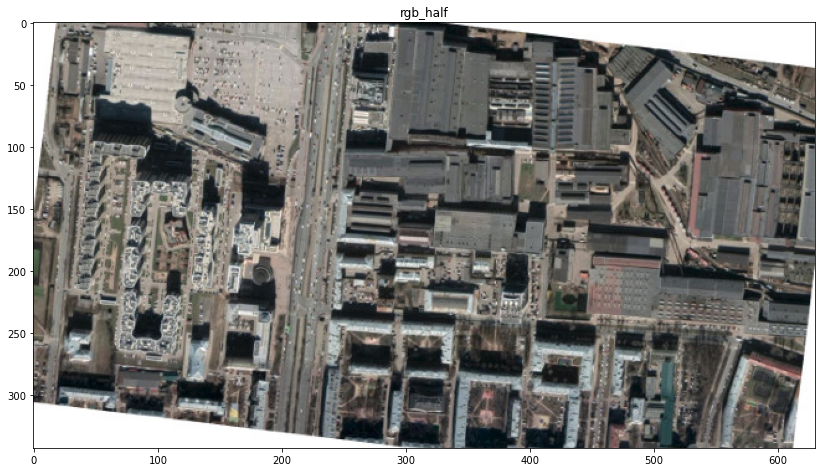

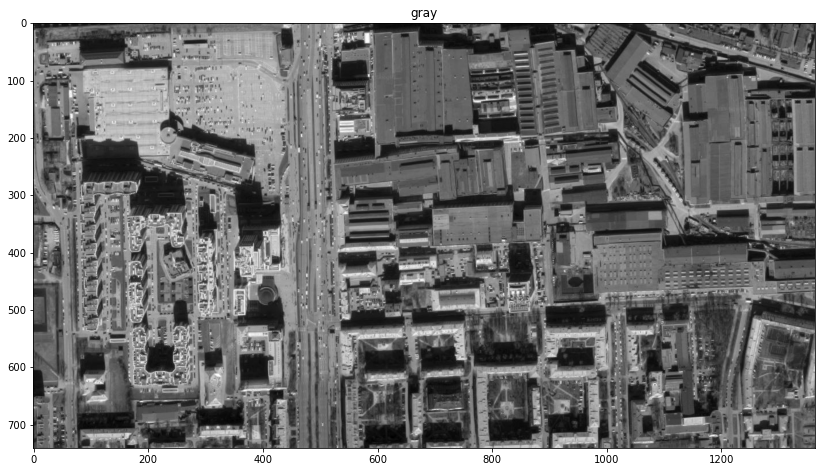

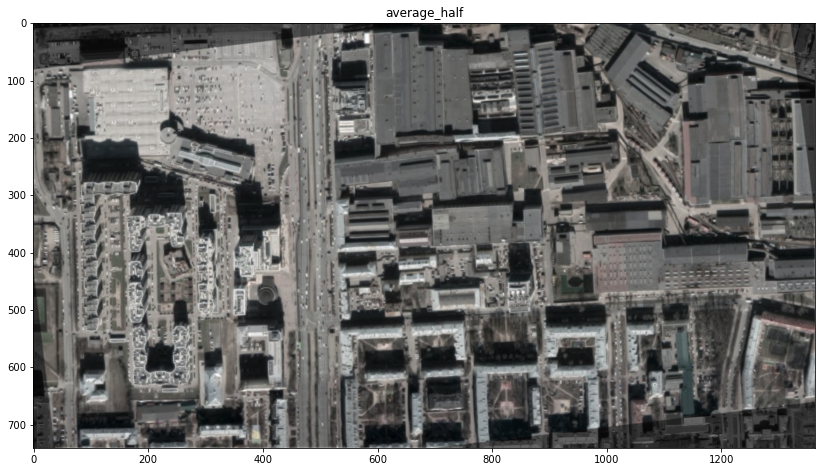

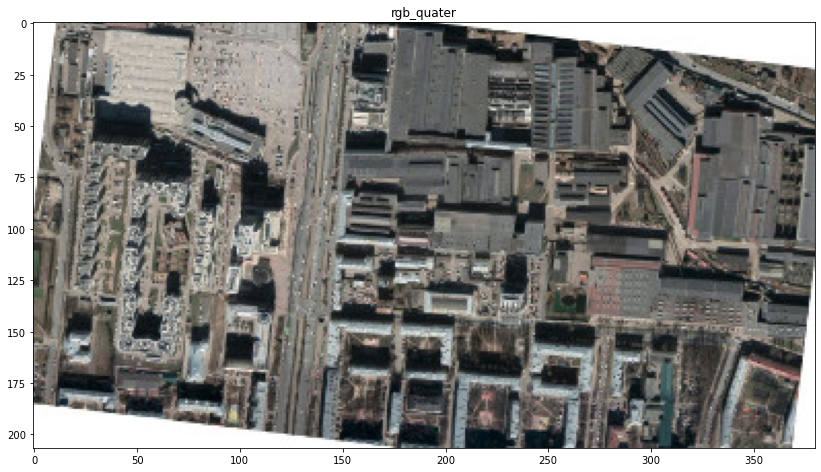

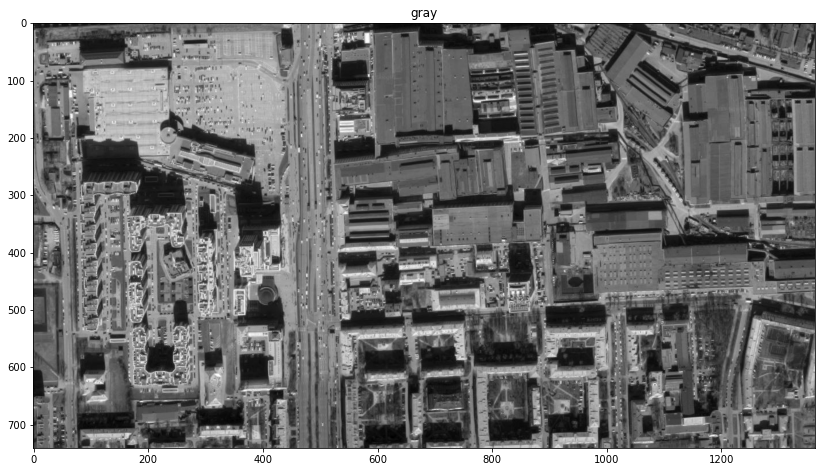

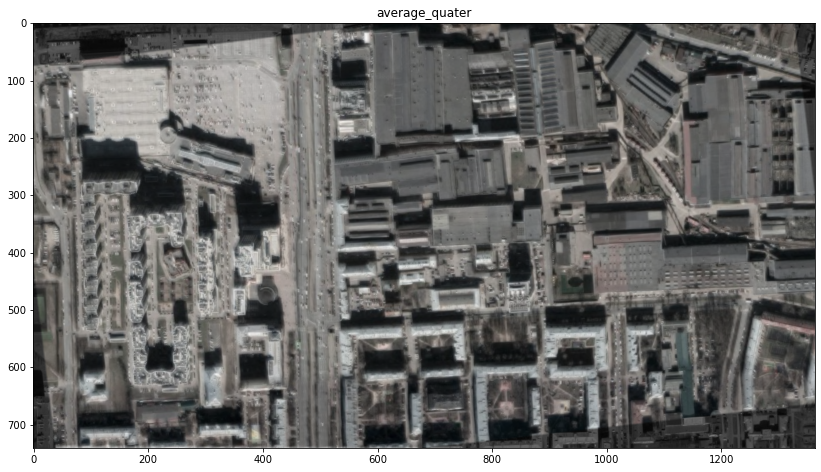

In [9]:
# Average
average_half = pan_sharpening(rgb_half_aligned.copy(), gray.copy(), algorithm="Average")
average_quater = pan_sharpening(rgb_quater_aligned.copy(), gray.copy(), algorithm="Average")
# Half
plt.imshow(rgb_half)
plt.title("rgb_half")
plt.show()
plt.imshow(gray)
plt.title("gray")
plt.show()
plt.imshow(average_half)
plt.title("average_half")
plt.show()
# Quater
plt.imshow(rgb_quater)
plt.title("rgb_quater")
plt.show()
plt.imshow(gray)
plt.title("gray")
plt.show()
plt.imshow(average_quater)
plt.title("average_quater")
plt.show()

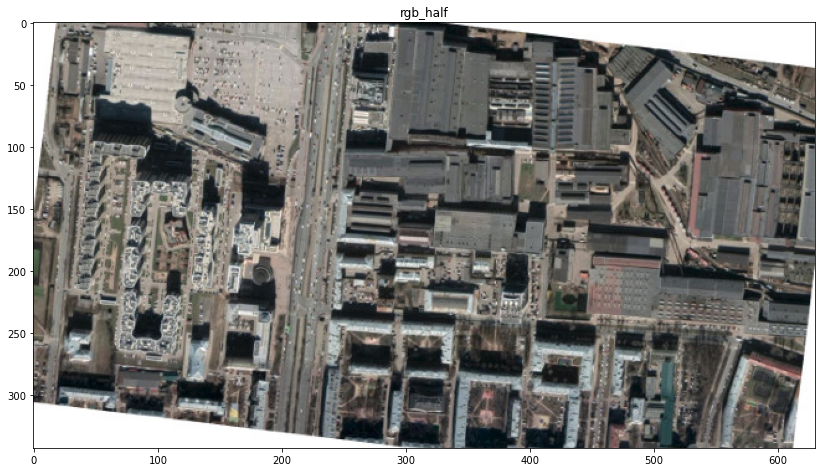

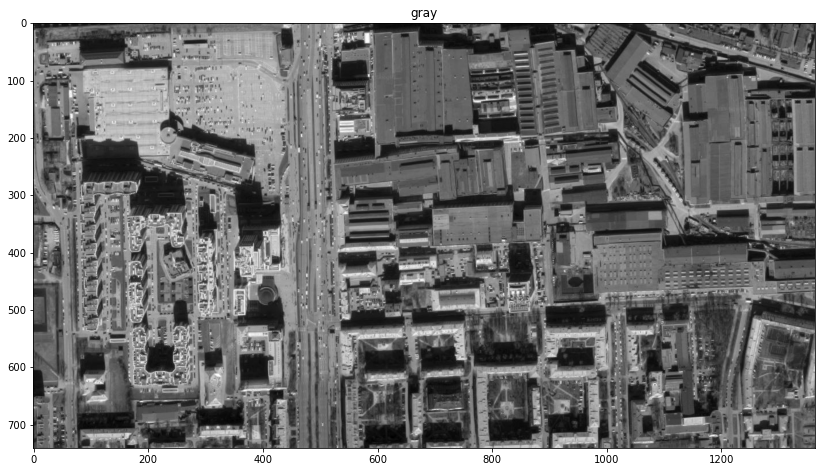

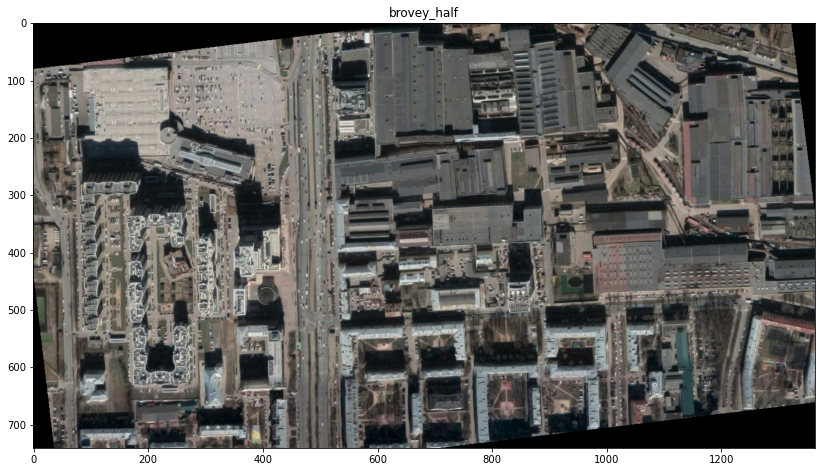

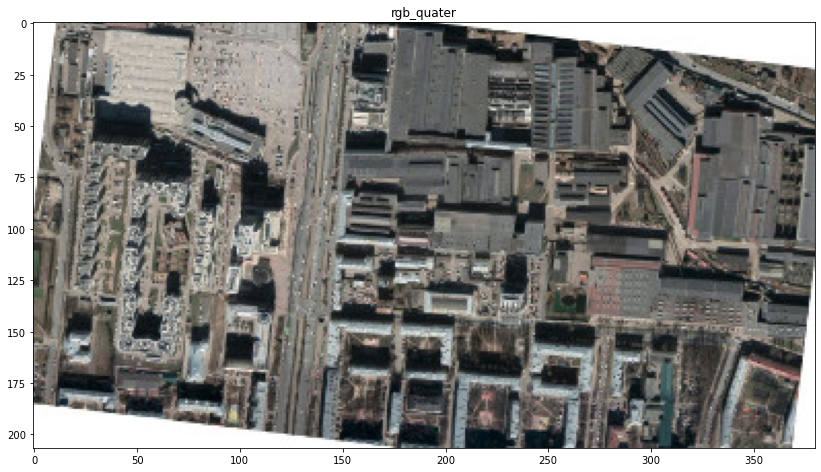

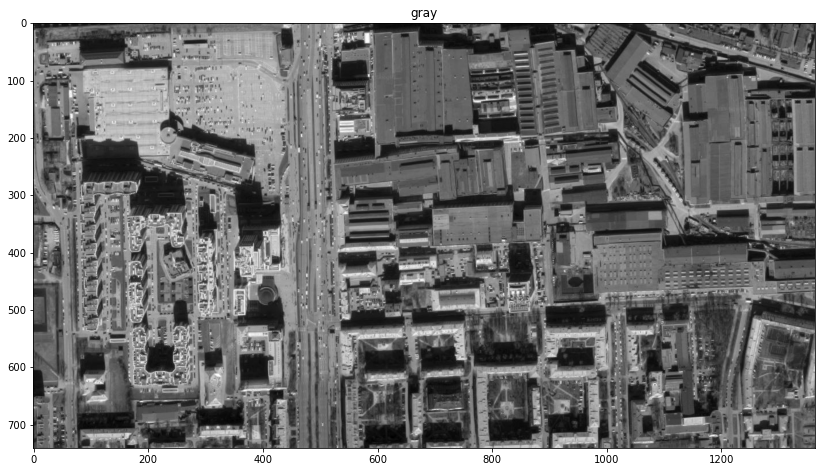

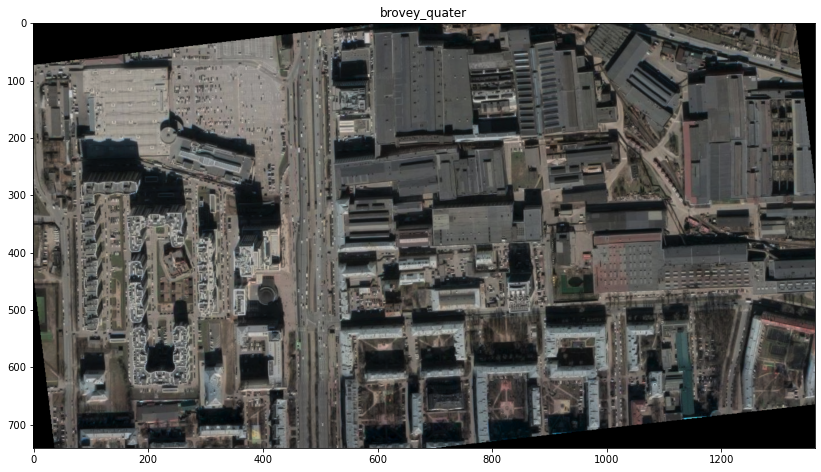

In [10]:
# brovey
brovey_half = pan_sharpening(rgb_half_aligned.copy(), gray.copy(), algorithm="Brovey")
brovey_quater = pan_sharpening(rgb_quater_aligned.copy(), gray.copy(), algorithm="Brovey")
# Half
plt.imshow(rgb_half)
plt.title("rgb_half")
plt.show()
plt.imshow(gray)
plt.title("gray")
plt.show()
plt.imshow(brovey_half)
plt.title("brovey_half")
plt.show()
# Quater
plt.imshow(rgb_quater)
plt.title("rgb_quater")
plt.show()
plt.imshow(gray)
plt.title("gray")
plt.show()
plt.imshow(brovey_quater)
plt.title("brovey_quater")
plt.show()

<b> Conclusion: </b> Brovey algorithm visually looks better to me

# Task 2

## Load data

In [11]:
from glob import glob
from tqdm.notebook import tqdm
import time

In [12]:
# donwload from gdrive
gdd.download_file_from_google_drive(file_id='17cpPYpJYCjLyiLA5sSSu80s7AgvNXTne',
                                    dest_path='./data/hw1_extra.zip')

In [13]:
# unzip
with zipfile.ZipFile("./data/hw1_extra.zip", 'r') as zip_ref:
    zip_ref.extractall("./data/")

## Camera calibration

In [14]:
def camera_calibration(img_count):
    bad_images = 0
    board_size = (9,7)
    criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001)
    objpoints = []
    imgpoints = []
    
    objp = np.zeros((1, board_size[0] * board_size[1], 3), np.float32)
    objp[0,:,:2] = np.mgrid[0:board_size[0], 0:board_size[1]].T.reshape(-1, 2)
    prev_img_shape = None
    images = glob('./data/calibration5/*.jpg')[:img_count]

    for fname in tqdm(images):
        img = cv2.imread(fname)
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        ret, corners = cv2.findChessboardCorners(gray,
                                                 board_size,
                                                 cv2.CALIB_CB_ADAPTIVE_THRESH + cv2.CALIB_CB_FAST_CHECK + cv2.CALIB_CB_NORMALIZE_IMAGE)

        if ret == True:
            objpoints.append(objp)
            corners2 = cv2.cornerSubPix(gray, corners, (11,11),(-1,-1), criteria) # уточнение координат
            imgpoints.append(corners2)
        else:
            bad_images += 1

    h,w = img.shape[:2]
    start_time = time.time()
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)
    time_for_calibrate = time.time() - start_time
    return ret, mtx, dist, rvecs, tvecs, bad_images, time_for_calibrate

In [15]:
ret, mtx, dist, rvecs, tvecs, bad_images, time_for_calibrate = camera_calibration(img_count = 100)
print('Bad images: ', bad_images)
print('Time for camera calibrate:', time_for_calibrate)

  0%|          | 0/100 [00:00<?, ?it/s]

Bad images:  1
Time for camera calibrate: 37.39077830314636


## Pose Estimation

In [17]:
def draw(img, corners, imgpts):
    imgpts = np.int32(imgpts).reshape(-1,2)
    # draw ground floor in green
    img = cv2.drawContours(img, [imgpts[:4]],-1,(0,255,0),-3)
    # draw pillars in blue color
    for i,j in zip(range(4),range(4,8)):
        img = cv2.line(img, tuple(imgpts[i]), tuple(imgpts[j]),(255),3)
    # draw top layer in red color
    img = cv2.drawContours(img, [imgpts[4:]],-1,(0,0,255),3)
    return img

In [18]:
# from opencv manual
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001)
objp = np.zeros((7*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:7].T.reshape(-1,2)
axis = np.float32([[0,0,0], [0,3,0], [3,3,0], [3,0,0],
                   [0,0,-3],[0,3,-3],[3,3,-3],[3,0,-3] ])

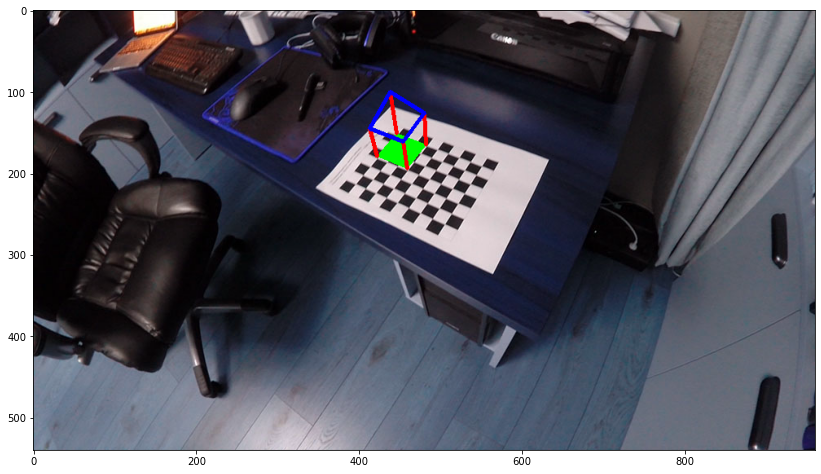

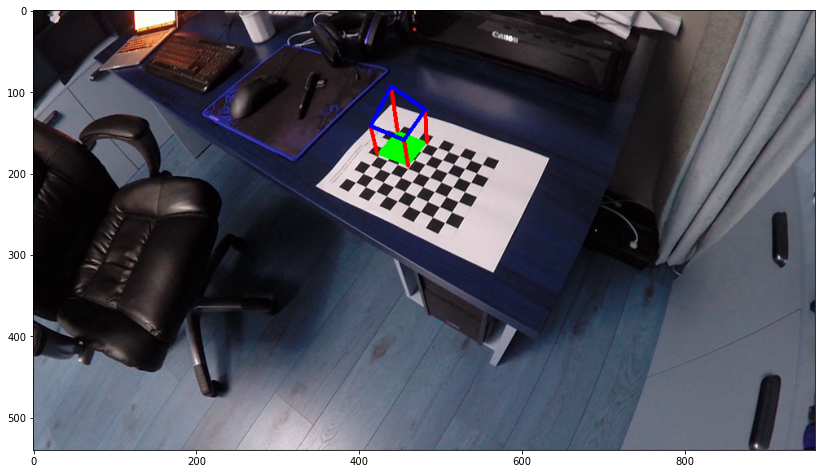

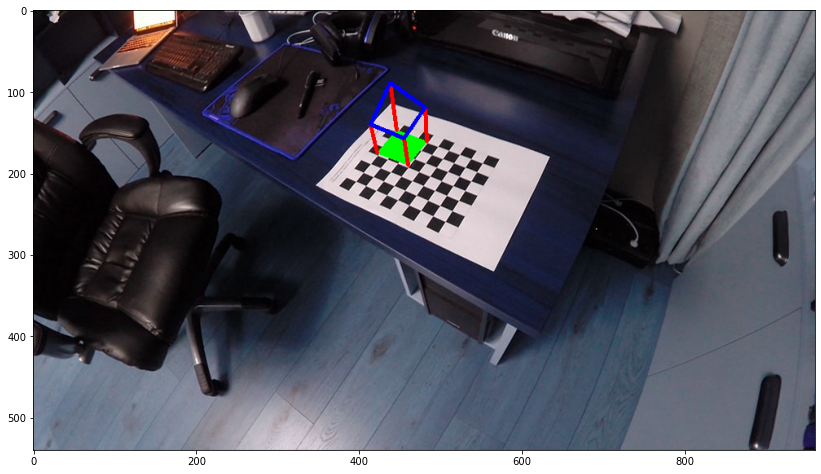

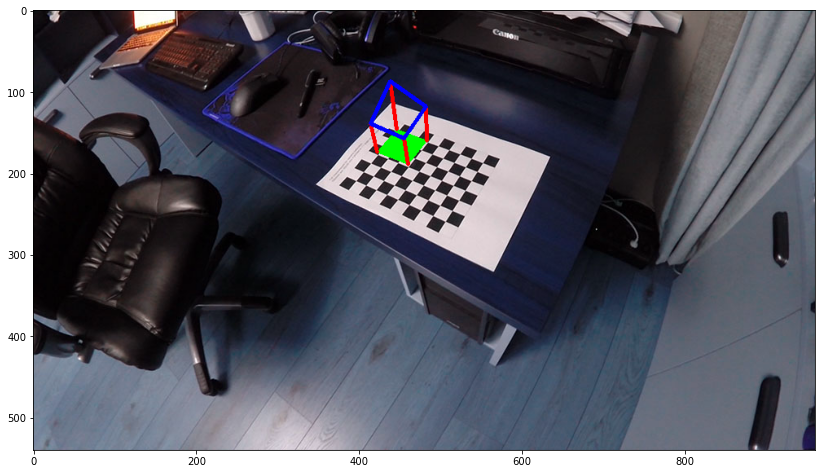

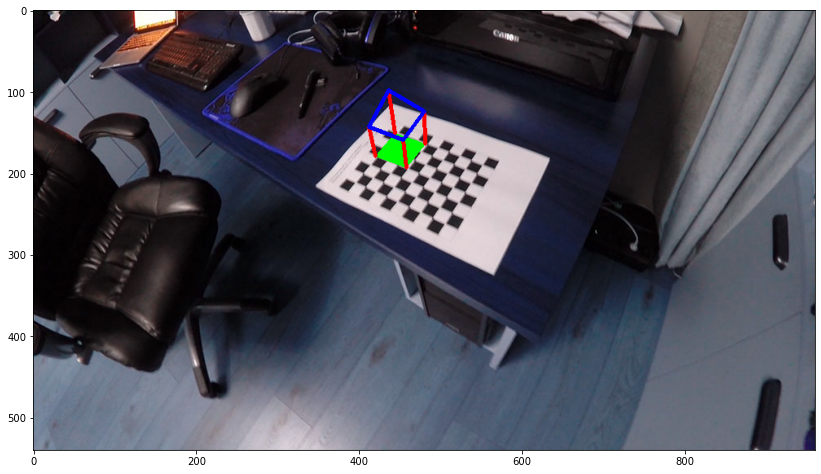

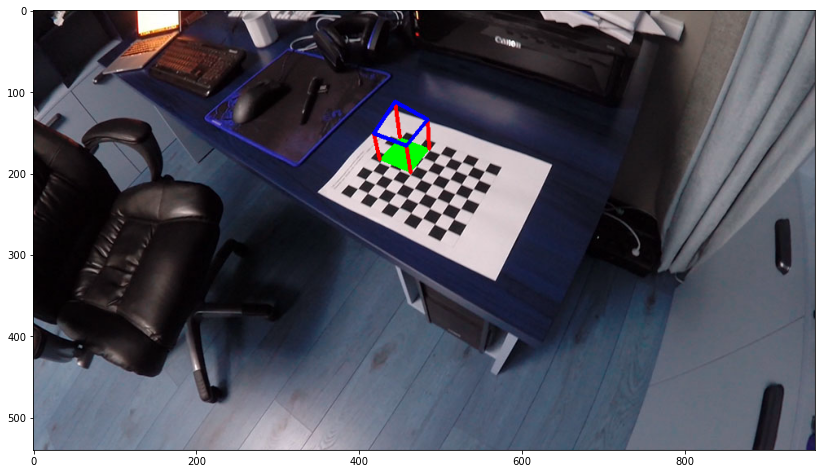

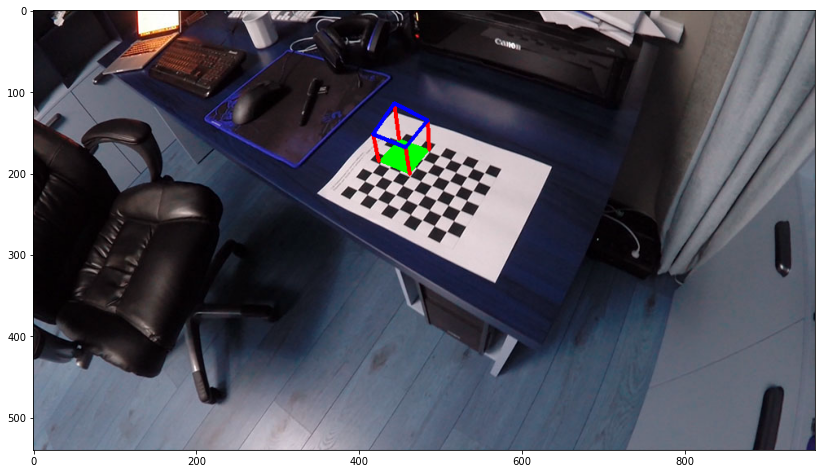

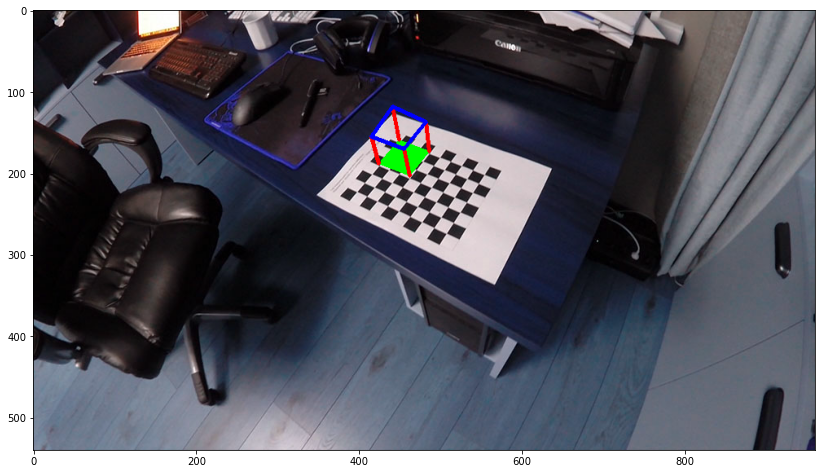

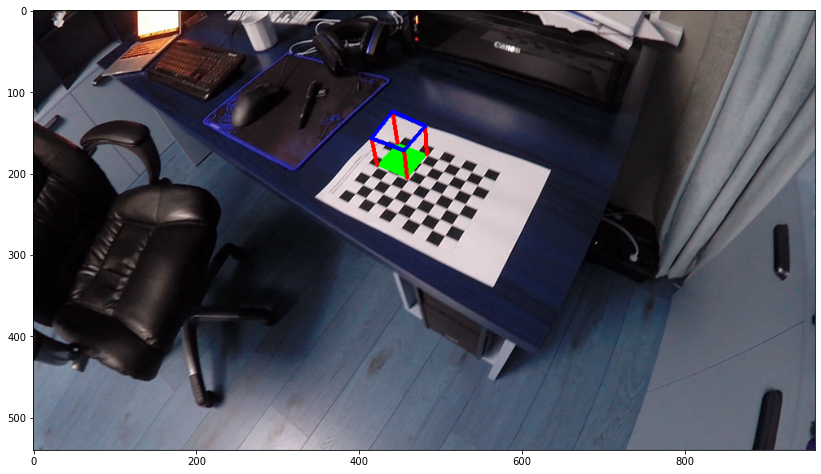

In [19]:
# drow for first 10 images
images = glob('./data/calibration5/*.jpg')[:10]
for fname in images:
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    board_size = (9, 7)
    ret, corners = cv2.findChessboardCorners(gray, board_size, None)
    if ret == True:
        corners2 = cv2.cornerSubPix(gray,corners,(11,11),(-1,-1),criteria)
        # Find the rotation and translation vectors.
        ret, rvecs, tvecs = cv2.solvePnP(objp, corners2, mtx, dist)
        # project 3D points to image plane
        imgpts, jac = cv2.projectPoints(axis, rvecs, tvecs, mtx, dist)
        img = draw(img,corners2,imgpts)
        plt.imshow(img)
        plt.show()

<b> Conclusion: </b> looks not perfect, but in my opinion not bad for such small chess boards